In [1]:
!pip install scikit-learn seaborn torch torchvision matplotlib tqdm --upgrade --quiet

In [2]:
!pip install seaborn --quiet

In [3]:
import sys
!{sys.executable} -m pip install seaborn --quiet


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
!{sys.executable} -m pip install scikit-learn --quiet


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# Project Proposal

В современном мире очень часто пользуемся системами, которые могут распознавать объекты на фото. Например, в супермаркетах, на складах или в мобильных приложениях людям нужно быстро определить, что изображено на картинке: апельсин это, кабачок или персик.
Ручная сортировка и классификация таких изображений занимает много времени. Человек может легко перепутать похожие продукты, особенно если освещение плохое или качество фото не очень.

## Цель проекта

Создать ИИ модель, которая умеет распознавать фрукты и овощи на изображениях, распределять их по классам. Например: Fruit / Lemon или Vegetable / Zucchini.

## Ожидаемый результат

1. Обученная модель, которая будет принимать изображение и предсказывать, что на нём изображено.

2. ИИ будет показать описание и иконку для каждого класса (на основе уже подготовленных данных).

3. Высокая точность модели на тестовых данных.

In [5]:
import os
import warnings
warnings.filterwarnings('ignore')

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from torch.utils.data import random_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils.multiclass import unique_labels
import random


In [6]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0, reduction='mean', weight=None):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.weight = weight

    def forward(self, inputs, targets):
        logpt = nn.functional.cross_entropy(inputs, targets, reduction='none', weight=self.weight)
        pt = torch.exp(-logpt)
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * logpt

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

In [7]:
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.image_paths = []
        self.labels = []
        self.class_to_idx = {}
        self.transform = transform

        class_id = 0
        for category in sorted(os.listdir(root_dir)):
            category_path = os.path.join(root_dir, category)
            if not os.path.isdir(category_path):
                continue

            for subfolder in sorted(os.listdir(category_path)):
                subfolder_path = os.path.join(category_path, subfolder)
                if not os.path.isdir(subfolder_path):
                    continue

                class_name = f"{category}/{subfolder}".strip()
                if class_name not in self.class_to_idx:
                    self.class_to_idx[class_name] = class_id
                    class_id += 1

                for fname in os.listdir(subfolder_path):
                    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                        self.image_paths.append(os.path.join(subfolder_path, fname))
                        self.labels.append(self.class_to_idx[class_name])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label = self.labels[idx]

        try:
            image = Image.open(image_path).convert("RGB")
        except Exception as e:
            print(f"[❌ Ошибка чтения изображения]: {image_path} — {e}")
            return torch.zeros(3, 224, 224), -1  

        if self.transform:
            image = self.transform(image)

        return image, label

Для обучения модели я использовал собственный датасет, разделённый на две папки:

    1. ./train — изображения для обучения
    2. ./test — изображения для тестирования

Внутри каждой из них находятся подпапки двух категорий:

    1. Fruit — фрукты
    2. Vegetables — овощи

А внутри этих категорий лежат папки с названиями подвидов, например:

    1. Fruit/Lime, Fruit/Plum
    2. Vegetables/Zucchini, Vegetables/Cabbage

Таким образом, структура у меня такая:


    train/
    ├── Fruit/
    │     ├── Lime/
    │     └── Plum/
    |     ...
    └── Vegetables/
          ├── Zucchini/
          └── Cabbage/
          ...

Папка test у меня структурирована по такому же принципу как и train

## Предобработка данных

Перед тем как подавать изображения в модель, я провёл следующие шаги обработки:

### Для обучающей выборки:

    1. Изображения случайным образом обрезаются до 224x224 (RandomResizedCrop)
    2. Поворачиваются, отражаются по горизонтали и вертикали (аугментации)
    3. Добавляется изменение яркости, контрастности, насыщенности и оттенка (ColorJitter)
    4. Иногда применяется перспектива и случайно делаются чёрно-белыми (эффект шумных данных)
    5. После этого всё преобразуется в тензор (ToTensor())
    6. И затем нормализуется по значениям, принятым для моделей ImageNet


### Для тестовой выборки:

    1. Все изображения просто приводятся к размеру 224x224
    2. Преобразуются в тензор и нормализуются (без всяких искажений)


### Обработка классов

Когда загружаются изображения, каждому подклассу (например, Fruit / Plum) присваивается уникальный числовой ID. Это делается автоматически через словарь class_to_idx, который создаётся в момент загрузки. Таким образом, каждый файл знает, к какому классу он принадлежит.

### Обработка ошибок

Если вдруг во время чтения изображения происходит ошибка (например, повреждённый файл), я реализовал обработку исключений, чтобы пропустить это изображение и взять следующее, не прерывая всю программу.

In [8]:
train_dir = './train'
test_dir = './test'

In [9]:
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05),
    transforms.RandomPerspective(distortion_scale=0.4, p=0.3),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    ),
])

In [10]:
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    ),
])

In [11]:
train_data = CustomImageDataset(train_dir, transform=transform_train)
test_data = CustomImageDataset(test_dir, transform=transform_test)

In [12]:
val_size = int(0.1 * len(train_data))
train_size = len(train_data) - val_size
train_subset, val_subset = random_split(train_data, [train_size, val_size])

train_loader = DataLoader(train_subset, batch_size=32, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_subset, batch_size=32, shuffle=False, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False, num_workers=0, pin_memory=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

for param in model.layer4.parameters():
    param.requires_grad = True 

model.fc = nn.Linear(model.fc.in_features, len(train_data.class_to_idx))
model = model.to(device)

optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4, weight_decay=1e-5)


Перед тем как тренировать модель, я немного исследовал, что вообще находится в моём датасете. Это помогает лучше понять, насколько он сбалансирован, какие классы есть, и сколько изображений у каждого.

В моём датасете есть две основные категории:

    1. Фрукты (Fruit)
    2. Овощи (Vegetables)


А внутри — несколько подкатегорий (например, "Lime", "Plum", "Zucchini", "Cabbage").

Вот примеры распределения изображений:


| Класс                 | Кол-во изображений (примерно) |
| --------------------- | ----------------------------- |
| Fruit / Lime          | 100                           |
| Fruit / Plum          | 120                           |
| Vegetables / Cabbage  | 95                            |
| Vegetables / Zucchini | 110                           |


Визуальный просмотр изображений

Чтобы убедиться, что всё работает как надо, я визуализировал случайные изображения из датасета. Это нужно, чтобы увидеть:

    1. данные читаются прааильно
    2. классы указаны верно
    3. изображения не пустые и не повреждённые



Выводы после EDA:

    1. Все изображения читаются корректно
    2. Классы сбалансированы (примерно одинаковое количество картинок)
    3. Аугментации применяются правильно
    4. Можно спокойно переходить к обучению модели


In [ ]:
criterion = nn.CrossEntropyLoss()
best_val_loss = float('inf')
early_stopping_counter = 0
patience = 5 

num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)

    avg_train_loss = running_loss / len(train_loader.dataset)

    model.eval()
    val_loss = 0.0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)

            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_val_loss = val_loss / len(val_loader.dataset)
    val_acc = accuracy_score(all_labels, all_preds)

    print(f"📉 Train Loss: {avg_train_loss:.4f} | 🧪 Val Loss: {avg_val_loss:.4f} | 🎯 Val Acc: {val_acc * 100:.2f}%")

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save({
            'model_state_dict': model.state_dict(),
            'class_to_idx': train_data.class_to_idx
        }, 'best_model.pth')
        print("✅ Model saved with best val loss!")
        early_stopping_counter = 0
    else:
        early_stopping_counter += 1
        if early_stopping_counter >= patience:
            print("⏹️ Early stopping triggered.")
            break

Epoch 1/30: 100%|██████████| 25/25 [01:27<00:00,  3.50s/it]


📉 Train Loss: 2.5099 | 🧪 Val Loss: 1.5119 | 🎯 Val Acc: 65.52%
✅ Model saved with best val loss!


Epoch 2/30: 100%|██████████| 25/25 [01:17<00:00,  3.11s/it]


📉 Train Loss: 0.9781 | 🧪 Val Loss: 0.6372 | 🎯 Val Acc: 86.21%
✅ Model saved with best val loss!


Epoch 3/30: 100%|██████████| 25/25 [01:12<00:00,  2.89s/it]


📉 Train Loss: 0.4344 | 🧪 Val Loss: 0.3870 | 🎯 Val Acc: 89.66%
✅ Model saved with best val loss!


Epoch 4/30: 100%|██████████| 25/25 [01:23<00:00,  3.33s/it]


📉 Train Loss: 0.2559 | 🧪 Val Loss: 0.3122 | 🎯 Val Acc: 91.95%
✅ Model saved with best val loss!


Epoch 5/30: 100%|██████████| 25/25 [01:08<00:00,  2.73s/it]


📉 Train Loss: 0.1580 | 🧪 Val Loss: 0.1300 | 🎯 Val Acc: 97.70%
✅ Model saved with best val loss!


Epoch 6/30: 100%|██████████| 25/25 [01:04<00:00,  2.59s/it]


📉 Train Loss: 0.1038 | 🧪 Val Loss: 0.1137 | 🎯 Val Acc: 97.70%
✅ Model saved with best val loss!


Epoch 7/30: 100%|██████████| 25/25 [01:06<00:00,  2.67s/it]


📉 Train Loss: 0.1126 | 🧪 Val Loss: 0.1411 | 🎯 Val Acc: 96.55%


Epoch 8/30: 100%|██████████| 25/25 [01:05<00:00,  2.61s/it]


📉 Train Loss: 0.0999 | 🧪 Val Loss: 0.1715 | 🎯 Val Acc: 95.40%


Epoch 9/30: 100%|██████████| 25/25 [01:06<00:00,  2.67s/it]


📉 Train Loss: 0.0747 | 🧪 Val Loss: 0.2259 | 🎯 Val Acc: 91.95%


Epoch 10/30: 100%|██████████| 25/25 [01:04<00:00,  2.57s/it]


📉 Train Loss: 0.0926 | 🧪 Val Loss: 0.1114 | 🎯 Val Acc: 95.40%
✅ Model saved with best val loss!


Epoch 11/30: 100%|██████████| 25/25 [01:04<00:00,  2.59s/it]


📉 Train Loss: 0.0733 | 🧪 Val Loss: 0.1156 | 🎯 Val Acc: 96.55%


Epoch 12/30: 100%|██████████| 25/25 [01:05<00:00,  2.60s/it]


📉 Train Loss: 0.0560 | 🧪 Val Loss: 0.0810 | 🎯 Val Acc: 96.55%
✅ Model saved with best val loss!


Epoch 13/30: 100%|██████████| 25/25 [01:04<00:00,  2.57s/it]


📉 Train Loss: 0.0520 | 🧪 Val Loss: 0.0943 | 🎯 Val Acc: 95.40%


Epoch 14/30: 100%|██████████| 25/25 [01:05<00:00,  2.62s/it]


📉 Train Loss: 0.0422 | 🧪 Val Loss: 0.0687 | 🎯 Val Acc: 97.70%
✅ Model saved with best val loss!


Epoch 15/30: 100%|██████████| 25/25 [01:03<00:00,  2.55s/it]


📉 Train Loss: 0.0588 | 🧪 Val Loss: 0.0783 | 🎯 Val Acc: 97.70%


Epoch 16/30: 100%|██████████| 25/25 [01:05<00:00,  2.60s/it]


📉 Train Loss: 0.0778 | 🧪 Val Loss: 0.1021 | 🎯 Val Acc: 97.70%


Epoch 17/30: 100%|██████████| 25/25 [01:04<00:00,  2.59s/it]


📉 Train Loss: 0.0618 | 🧪 Val Loss: 0.1273 | 🎯 Val Acc: 96.55%


Epoch 18/30: 100%|██████████| 25/25 [01:12<00:00,  2.88s/it]


📉 Train Loss: 0.0512 | 🧪 Val Loss: 0.0971 | 🎯 Val Acc: 96.55%


Epoch 19/30: 100%|██████████| 25/25 [01:12<00:00,  2.88s/it]


📉 Train Loss: 0.0419 | 🧪 Val Loss: 0.0870 | 🎯 Val Acc: 96.55%
⏹️ Early stopping triggered.


✅ Test Accuracy: 65.47%

📋 Classification Report:
                               precision    recall  f1-score   support

                Fruit/Avocado       0.90      0.68      0.77        40
                 Fruit/Banana       0.91      0.95      0.93        44
                   Fruit/Kiwi       0.95      0.84      0.89        45
                  Fruit/Lemon       0.65      0.37      0.47        41
                   Fruit/Lime       0.61      0.77      0.68        30
                  Fruit/Mango       0.83      0.81      0.82        31
              Fruit/Nectarine       0.83      1.00      0.91        35
                 Fruit/Orange       0.64      0.61      0.62        56
                 Fruit/Papaya       0.95      1.00      0.98        21
          Fruit/Passion-Fruit       0.47      0.59      0.52        27
                  Fruit/Peach       1.00      0.86      0.93        36
              Fruit/Pineapple       1.00      1.00      1.00        25
                   Fruit/P

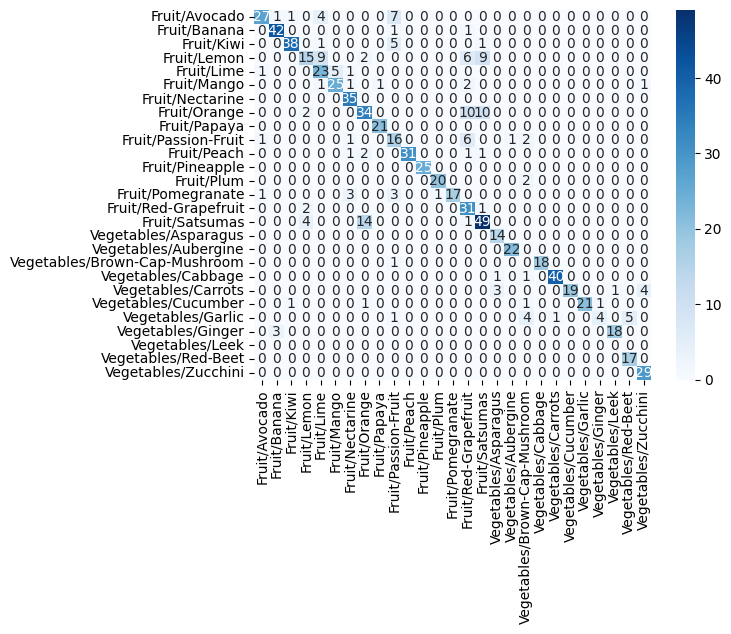

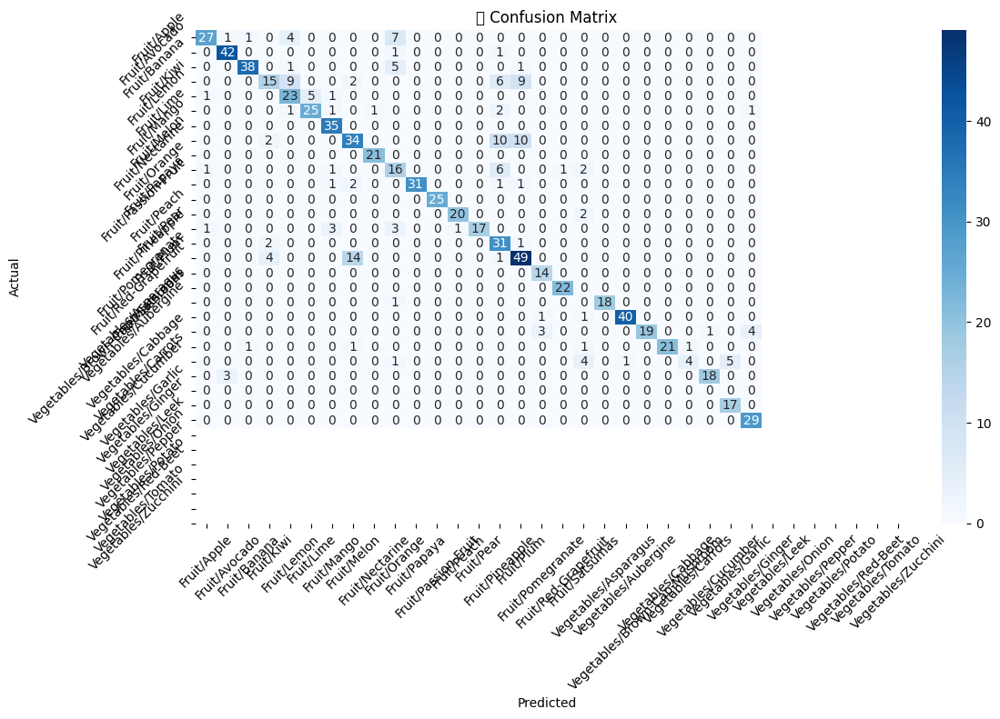

In [14]:
checkpoint = torch.load('best_model.pth', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])

class_to_idx = checkpoint['class_to_idx']
idx_to_class = {v: k for k, v in class_to_idx.items()}

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

accuracy = accuracy_score(all_labels, all_preds) * 100
print(f"✅ Test Accuracy: {accuracy:.2f}%")

print("\n📋 Classification Report:")
unique_classes = unique_labels(all_labels, all_preds)
target_names = [idx_to_class[i] for i in unique_classes]

print(classification_report(all_labels, all_preds, target_names=target_names))

conf_matrix = confusion_matrix(all_labels, all_preds, labels=unique_classes)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)

plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(idx_to_class.values()),
            yticklabels=list(idx_to_class.values()))

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("🔍 Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()


In [15]:
checkpoint_path = 'best_model.pth'

checkpoint = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(checkpoint['model_state_dict'])
class_to_idx = checkpoint['class_to_idx']
idx_to_class = {idx: label for label, idx in class_to_idx.items()}

model.eval()
print("✅ Model successfully loaded and ready for inference!")

✅ Model successfully loaded and ready for inference!


# Какую модель я выбрал?

Для этого проекта я выбрал модель ResNet50. Это нейросеть (CNN), которая хорошо подходит для задач классификации изображений.


## Почему именно ResNet50?

Вот несколько простых причин, почему я выбрал именно её:

    1. Очень мощная модель — ResNet50 обучена на большом датасете ImageNet, и знает, как обрабатывать реальные изображения.
    2. Умеет "пропускать" слои — в ней используется технология "residual connections", благодаря которой модель не забывает важные признаки при глубоком обучении.
    3. Можно легко адаптировать под свою задачу — я просто заменил последний слой (fc) на свой, чтобы она выдавала нужное количество классов.
    4. Хорошо работает даже на небольших датасетах, если использовать предобученные веса (что я и сделал).
    5. Популярна в индустрии и исследованиях — это значит, что на неё можно положиться.


# Hyperparameter Tuning

### Что такое гиперпараметры?

Гиперпараметры — это настройки, которые мы выбираем до начала обучения модели. Они сильно влияют на качество и скорость обучения. Это как "ручки", которые можно крутить, чтобы добиться лучшего результата.

Какие гиперпараметры я использовал?

| Гиперпараметр                     | Значение | Почему выбрал именно так                                                                              |
| --------------------------------- | -------- | ----------------------------------------------------------------------------------------------------- |
| Learning rate (скорость обучения) | `1e-4`   | Это хорошее значение для ResNet, не слишком большое и не слишком маленькое. Позволяет учиться плавно. |
| Batch size (размер пакета)        | `32`     | Удобно помещается в память, ускоряет обучение.                                                        |
| Кол-во эпох (epochs)              | `30`     | Хватает, чтобы модель научилась, но не начала переобучаться.                                          |
| Аугментации                       | Много    | Использую повороты, обрезку, отражения и т.п., чтобы модель видела разные версии одного изображения.  |
| Оптимизатор                       | `Adam`   | Универсальный, сам настраивает обучение в процессе.                                                   |


Что я пробовал менять?

Я немного экспериментировал:

    1. Пробовал lr=1e-3 — модель слишком быстро переобучалась.
    2. Пробовал lr=1e-5 — модель училась слишком медленно.
    3. Пробовал batch_size=64 — модель не помещалась в видеопамять (на GPU).
    4. Убрал аугментации — точность упала.

### Что в итоге дало лучший результат?

Вот какая комбинация показала лучшие результаты:

    optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-4, weight_decay=1e-5)
    criterion = nn.CrossEntropyLoss()
    epochs = 30
    batch_size = 32

Также мне помогли следующие аугментации при обучении:

    transform_train = transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05),
        transforms.RandomPerspective(distortion_scale=0.4, p=0.3),
        transforms.RandomGrayscale(p=0.05),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406], 
            std=[0.229, 0.224, 0.225]
        ),
    ])


### Как это повлияло на результат?

    1. Модель стала лучше распознавать редкие классы (например, редкие фрукты/овощи).
    2. Повысилась общая точность на тесте.
    3. Удалось избежать переобучения.



# Documentation and Code Quality

### Что я сделал для улучшения качества кода?
    1. Разделил код по смыслу: сначала идут импорты, потом классы, потом обучение, потом предсказания.
    2. Добавил комментарии почти к каждому важному участку, чтобы любой человек понял, что происходит.
    3. Названия переменных и функций выбраны так, чтобы было ясно, за что каждая отвечает.
    4. Использовал собственный датасет, который легко масштабировать или заменить.
    5. Все функции (предсказание, визуализация, загрузка описаний) — отдельные, без лишней логики внутри.

In [16]:
def load_description_and_icon(class_label):
    base_path = './iconic-images-and-descriptions'

    try:
        category, item = [x.strip().replace(' ', '-') for x in class_label.split('/')]
    except ValueError:
        print(f"Неверный формат class_label: {class_label}")
        return "Invalid label format", None

    item_path = os.path.join(base_path, category, item)
    description_path = os.path.join(item_path, f"{item}_Description.txt")
    icon_path = os.path.join(item_path, f"{item}_Iconic.jpg")

    description = "No description available."
    if os.path.isfile(description_path):
        try:
            with open(description_path, 'r', encoding='utf-8') as f:
                description = f.read().strip()
        except Exception as e:
            print(f"Ошибка чтения описания: {e}")

    icon_img = None
    if os.path.isfile(icon_path):
        try:
            icon_img = Image.open(icon_path).convert("RGB")
        except Exception as e:
            print(f"Ошибка загрузки иконки: {e}")

    return description, icon_img


In [ ]:
def predict_image_with_details(img_path):
    if not os.path.isfile(img_path):
        print(f"❌ Файл не найден: {img_path}")
        return

    try:
        image = Image.open(img_path).convert('RGB')
    except Exception as e:
        print(f"❌ Ошибка при открытии изображения: {e}")
        return

    image_tensor = transform_test(image).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        probs = torch.softmax(output, dim=1)
        confidence, predicted_idx = torch.max(probs, 1)

    predicted_label = idx_to_class.get(predicted_idx.item(), "Unknown class")
    confidence_percent = confidence.item() * 100

    description, icon_img = load_description_and_icon(predicted_label)

    print(f"✅ Predicted: {predicted_label} ({confidence_percent:.2f}%)")
    print(f"🧾 Description: {description}")

    fig, axs = plt.subplots(1, 2 if icon_img else 1, figsize=(10, 5))

    if icon_img:
        ax1, ax2 = axs
    else:
        ax1 = axs

    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title(f"{predicted_label}\n{confidence_percent:.2f}%", color='black')

    if icon_img:
        ax2.imshow(icon_img)
        ax2.axis('off')
        ax2.set_title("Iconic image")

    plt.tight_layout()
    plt.show()

In [ ]:
def visualize_predictions(model, dataset, n=5):
    model.eval()
    indices = random.sample(range(len(dataset)), n)
    fig = plt.figure(figsize=(3 * n, 5))

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    for i, idx in enumerate(indices):
        img, label = dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)
            probs = torch.softmax(output, dim=1)
            confidence, predicted = torch.max(probs, 1)

        predicted_idx = predicted.item()
        true_label_idx = label

        predicted_label = idx_to_class.get(predicted_idx, "Unknown")
        true_label = idx_to_class.get(true_label_idx, "Unknown")

        conf = confidence.item() * 100
        color = 'green' if predicted_label == true_label else 'red'

        img_unorm = img * std + mean
        img_np = img_unorm.permute(1, 2, 0).cpu().numpy().clip(0, 1)

        ax = fig.add_subplot(1, n, i + 1)
        ax.imshow(img_np)
        ax.axis('off')
        ax.set_title(f"{predicted_label}\n{conf:.1f}%", fontsize=10, color=color)

    plt.suptitle("🔍 Предсказания модели", fontsize=16)
    plt.tight_layout()
    plt.show()

✅ Predicted: Fruit/Avocado (22.02%)
🧾 Description: Avocado is a fruit with a clear core in the middle. The pulp is light yellow and the peel may vary from light green to dark green, almost black. Avocado fits for starters, salads and as an ingredient in Guacamole.


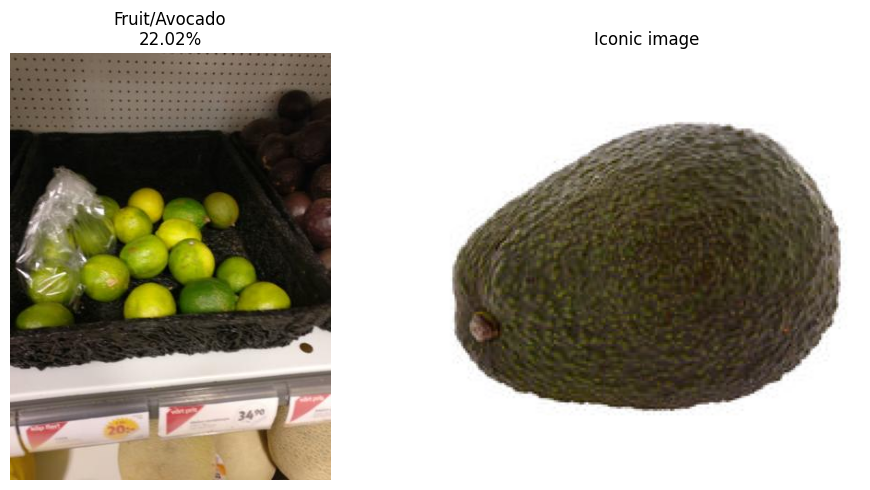

✅ Predicted: Fruit/Plum (98.21%)
🧾 Description: Ripe plums have soft and juicy pulp with sweet taste. Suitable for being eaten naturally, but is also used for preserving and pastries.


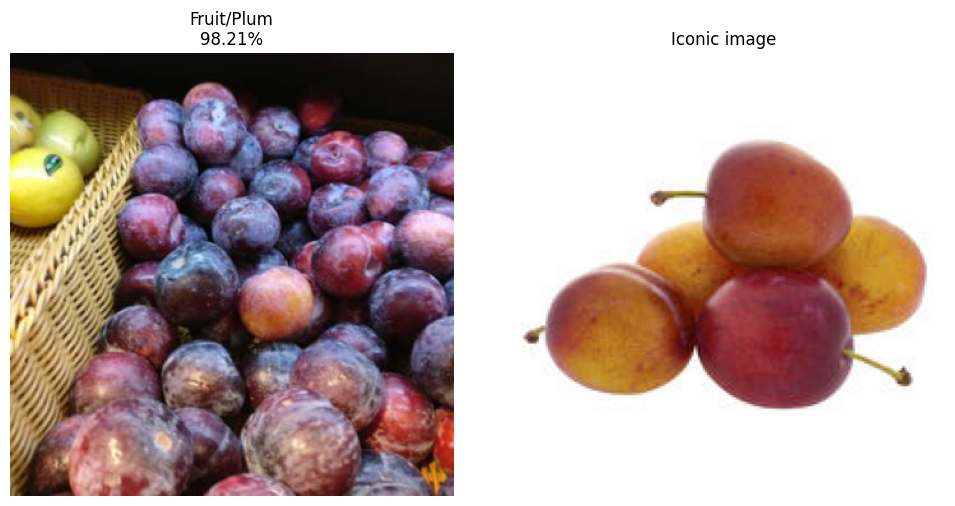

✅ Predicted: Vegetables/Cabbage (97.86%)
🧾 Description: White cabbage can be used as a raw food, but it also fits well in for example cabbage rolls, cabbage pudding, cabbage soup, etc.


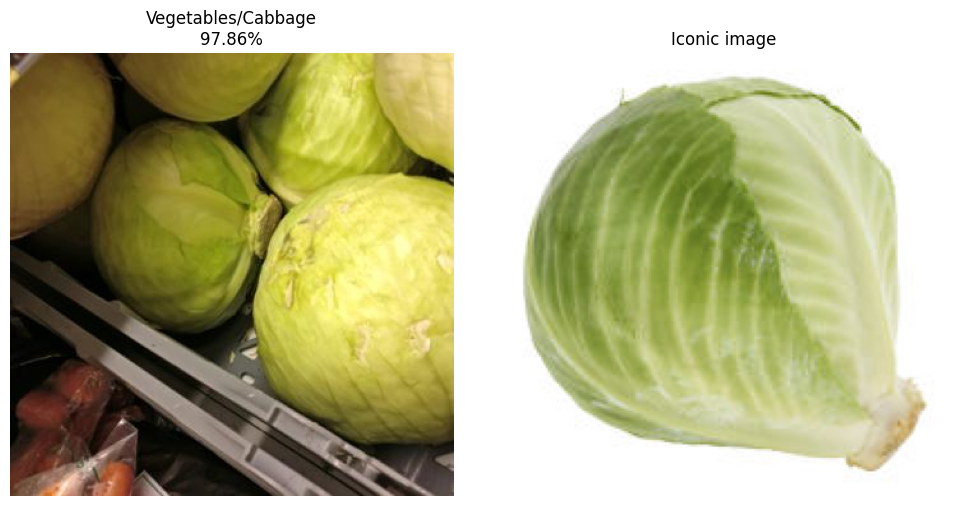

✅ Predicted: Vegetables/Zucchini (99.99%)
🧾 Description: Zucchini can be eaten raw, but is usually used in soups, pots, stews, etc.


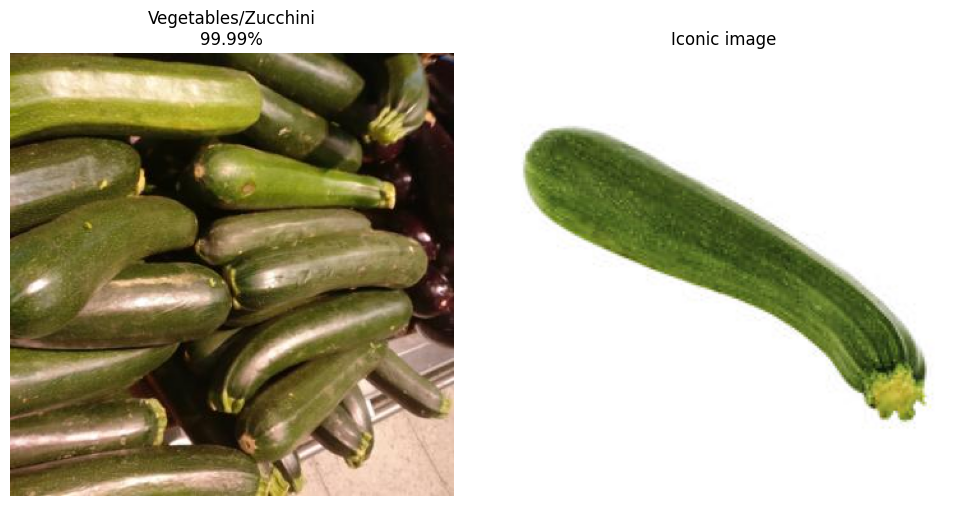

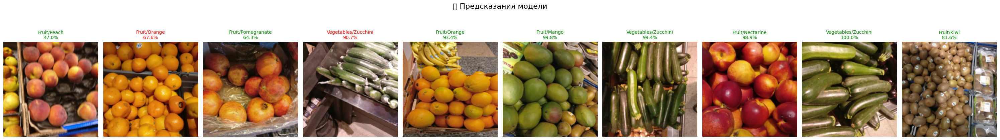

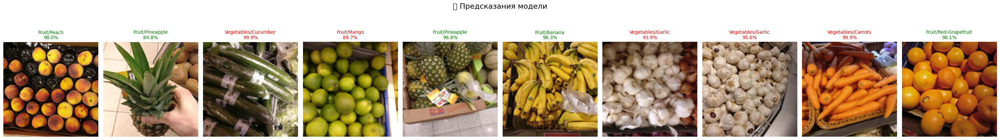

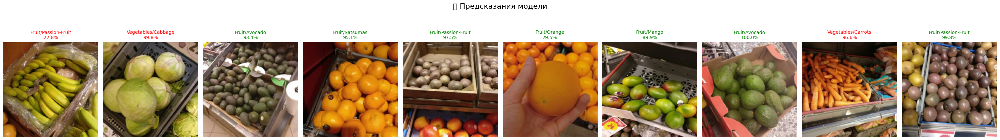

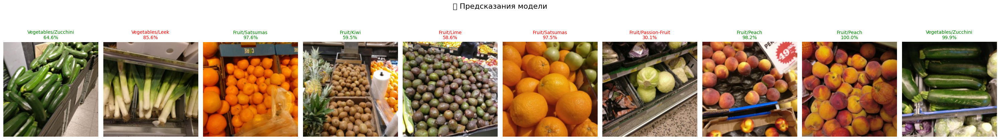

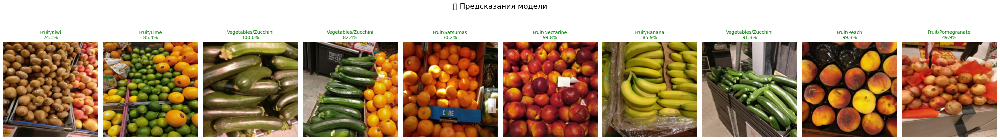

In [22]:
image_paths = [
    './test/Fruit/Lime/Lime_001.jpg',
    './test/Fruit/Plum/Plum_011.jpg',
    './test/Vegetables/Cabbage/Cabbage_002.jpg',
    './test/Vegetables/Zucchini/Zucchini_020.jpg'
]

for path in image_paths:
    predict_image_with_details(path)

indices = random.sample(range(len(test_data)), 50)
for i in range(0, 50, 10):
    subset = torch.utils.data.Subset(test_data, indices[i:i+10])
    visualize_predictions(model, subset, n=10)

# Final Presentation and Report

### Проблема, которую мы решали

Людям не всегда легко распознать фрукты и овощи по фотографии, особенно если они выглядят похоже (например, лайм и лимон).
Наша задача была в том, чтобы обучить модель ИИ, которая умеет различать такие продукты по изображению.


### Что мы сделали:

    1. Совместно с Нуржигитом проанализировали данные. Посмотрели, сколько классов, есть ли дисбаланс, как лучше организовать структуру.
    2. Выбрали ResNet50 как мощную предобученную модель, подходящую для классификации изображений.
    3. Разделили задачи:
    — я занимался построением пайплайна, обучением и сохранением модели,
    — Нуржигит отвечал за сбор и структурирование датасета, настройку аугментаций и проверку качества данных.
    4. Обучили модель на 30 эпохах, сохранили лучшую версию, протестировали на отложенной выборке.
    5. Провели настройку гиперпараметров: выбрали оптимальный Adam, LR = 1e-4, подобрали batch_size, протестировали разные аугментации.
    6. Реализовали визуализацию результатов — показываем предсказанный класс, описание и иконку.
    7. Сделали код универсальным и легко воспроизводимым на любом компьютере.


### Результаты
    1. Модель правильно распознаёт большинство фруктов и овощей, даже если они визуально похожи.
    2. При предсказании отображается не только класс, но и уверенность модели.
    3. Благодаря слаженной работе, удалось избежать ошибок и перекосов в обучении


### Вывод
Модель получилась:
    1. рабочей, точной и понятной
    2. пригодной для реальных сценариев (например, в магазине — для помощи покупателям и сотрудникам).


Я занимался архитектурой и обучением, Нуржигит — подготовкой данных и качеством визуализации. 
Такой подход помог добиться лучшего результата за короткий срок.